In [78]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import calmap
from datetime import datetime, date, time, timedelta
import os, sys

In [79]:
# Load the data with semicolon separator and parse the timestamp column
price_data_2021 = pd.read_csv('../data/electricity_prices_2021_new.csv', sep=';', parse_dates=['timestamp'])
price_data_2022 = pd.read_csv('../data/electricity_prices_2022_new.csv', sep=';', parse_dates=['timestamp'])
price_data_2023 = pd.read_csv('../data/electricity_prices_2023_new.csv', sep=';', parse_dates=['timestamp'])
price_data_2024 = pd.read_csv('../data/electricity_prices_2024_new.csv', sep=';', parse_dates=['timestamp'])


In [80]:
# Load the data with semicolon separator and parse the timestamp column
load_data_2021 = pd.read_csv('../data/electricity_loads_2021_new.csv', sep=';', parse_dates=['timestamp'])
load_data_2022 = pd.read_csv('../data/electricity_loads_2022_new.csv', sep=';', parse_dates=['timestamp'])
load_data_2023 = pd.read_csv('../data/electricity_loads_2023_new.csv', sep=';', parse_dates=['timestamp'])
load_data_2024 = pd.read_csv('../data/electricity_loads_2024_new.csv', sep=';', parse_dates=['timestamp'])


In [81]:
df_price = pd.concat([price_data_2021, price_data_2022, price_data_2023, price_data_2024], ignore_index=True, sort=False)

In [82]:
df_load = pd.concat([load_data_2021, load_data_2022, load_data_2023, load_data_2024], ignore_index=True, sort=False)

In [84]:

# Set the timestamp column as the index
df_price.set_index('timestamp', inplace=True)
df_load.set_index('timestamp', inplace=True)


In [85]:
df_price.index = pd.to_datetime(df_price.index, utc=True)
df_load.index = pd.to_datetime(df_load.index, utc=True)

In [86]:
print(df_price.index)

DatetimeIndex(['2020-12-31 23:00:00+00:00', '2021-01-01 00:00:00+00:00',
               '2021-01-01 01:00:00+00:00', '2021-01-01 02:00:00+00:00',
               '2021-01-01 03:00:00+00:00', '2021-01-01 04:00:00+00:00',
               '2021-01-01 05:00:00+00:00', '2021-01-01 06:00:00+00:00',
               '2021-01-01 07:00:00+00:00', '2021-01-01 08:00:00+00:00',
               ...
               '2024-12-30 14:00:00+00:00', '2024-12-30 15:00:00+00:00',
               '2024-12-30 16:00:00+00:00', '2024-12-30 17:00:00+00:00',
               '2024-12-30 18:00:00+00:00', '2024-12-30 19:00:00+00:00',
               '2024-12-30 20:00:00+00:00', '2024-12-30 21:00:00+00:00',
               '2024-12-30 22:00:00+00:00', '2024-12-30 23:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='timestamp', length=34972, freq=None)


In [87]:
load_all_statistics = df_load.describe(include='all')
print("Load Statistics:\n", load_all_statistics)

Load Statistics:
                   AL             AT            BA             BE  \
count  107800.000000  139872.000000  34813.000000  139872.000000   
mean      607.218664    6887.367815   1182.313848    9301.480125   
std       372.041035    1301.073311    368.786213    1333.529830   
min        96.000000    4009.000000      0.000000    5877.000000   
25%       227.000000    5844.000000    968.000000    8256.000000   
50%       604.000000    6848.000000   1203.000000    9297.000000   
75%       904.000000    7811.000000   1404.000000   10254.000000   
max      1626.000000   10388.000000  16591.000000   13562.000000   

                 BG            CH            CZ             DE            DK  \
count  34968.000000  34968.000000  48213.000000  139872.000000  34967.000000   
mean    4250.217113   7097.159431   7099.425902   54497.061685   4046.423228   
std      862.903338   1065.513448   1343.570806    9592.768459    725.630398   
min       31.000000   2743.000000   3798.000000  

In [88]:
price_all_statistics = df_price.describe(include='all')
print("Price Statistics:\n", price_all_statistics)

Price Statistics:
         AL            AT   BA            BE            BG            CH  \
count  0.0  34972.000000  0.0  34972.000000  34972.000000  34972.000000   
mean   NaN    138.156602  NaN    129.298941    170.371232    145.150987   
std    NaN    112.137661  NaN    108.155690    130.273043    114.466411   
min    NaN   -500.000000  NaN   -140.000000    -45.000000   -427.510000   
25%    NaN     71.010000  NaN     63.930000     90.000000     71.617500   
50%    NaN    103.225000  NaN     97.340000    127.900000    105.430000   
75%    NaN    170.100000  NaN    164.462500    213.020000    188.860000   
max    NaN    919.640000  NaN    871.000000   1061.040000    871.610000   

                 CZ   DE   DK            EE  ...            PT            RO  \
count  34972.000000  0.0  0.0  34972.000000  ...  34972.000000  34972.000000   
mean     133.676039  NaN  NaN    114.543044  ...    107.955523    171.940550   
std      107.387182  NaN  NaN    101.133611  ...     70.708070   

In [89]:
# Count the number of empty/None values for each country
empty_prices_count = df_price.isna().sum()

print(empty_prices_count)

AL    34972
AT        0
BA    34972
BE        0
BG        0
CH        0
CZ        0
DE    34972
DK    34972
EE        0
ES        0
FI        0
FR        0
GE    34972
GR        0
HR        0
HU        0
IE    34972
IT    34972
LT        0
LU    34972
LV        0
MD    34972
ME    20257
MK    20689
NL        0
NO    34972
PL        0
PT        0
RO        0
RS        0
RU    34972
SE    34972
SI        0
SK        0
UA    34972
UK    34972
XK    34972
dtype: int64


In [90]:
len(df_price)

34972

In [91]:
df_load.isna().sum()

AL     32083
AT        11
BA    105070
BE        11
BG    104915
CH    104915
CZ     91670
DE        11
DK    104916
EE    104915
ES     36451
FI     62510
FR    104960
GE    114150
GR    104918
HR     52425
HU        19
IE     71855
IT    104915
LT    101750
LU        11
LV    104915
MD    105570
ME    104915
MK    105443
NL        11
NO    104915
PL     90446
PT    104915
RO      2495
RS    104916
RU    139883
SE    104915
SI    104973
SK    104936
UA    129831
UK     80621
XK    110494
dtype: int64

In [92]:
len(df_load)

139883

In [93]:
# Calculate the percentage of missing values for each column
price_missing_percentage = df_price.isna().mean() * 100
price_missing_percentage = price_missing_percentage.apply(lambda x: f"{x:.2f}%")
print(price_missing_percentage)

AL    100.00%
AT      0.00%
BA    100.00%
BE      0.00%
BG      0.00%
CH      0.00%
CZ      0.00%
DE    100.00%
DK    100.00%
EE      0.00%
ES      0.00%
FI      0.00%
FR      0.00%
GE    100.00%
GR      0.00%
HR      0.00%
HU      0.00%
IE    100.00%
IT    100.00%
LT      0.00%
LU    100.00%
LV      0.00%
MD    100.00%
ME     57.92%
MK     59.16%
NL      0.00%
NO    100.00%
PL      0.00%
PT      0.00%
RO      0.00%
RS      0.00%
RU    100.00%
SE    100.00%
SI      0.00%
SK      0.00%
UA    100.00%
UK    100.00%
XK    100.00%
dtype: object


In [94]:

# Add missing percentage row to the statistics dataframe
price_all_statistics.loc['missing_percentage'] = price_missing_percentage

In [95]:
price_all_statistics.to_csv("../data/new_stat/price_all_statistics.csv", sep=";")

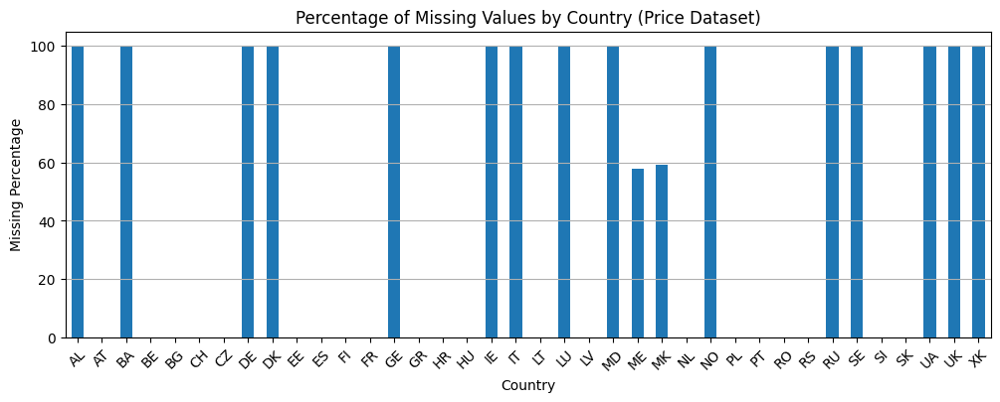

In [96]:
price_missing_percentage = df_price.isna().mean() * 100
# Plot the missing percentage data
plt.figure(figsize=(12,4))
price_missing_percentage.plot(kind='bar')
plt.title('Percentage of Missing Values by Country (Price Dataset)')
plt.xlabel('Country')
plt.ylabel('Missing Percentage')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show the plot
plt.show()

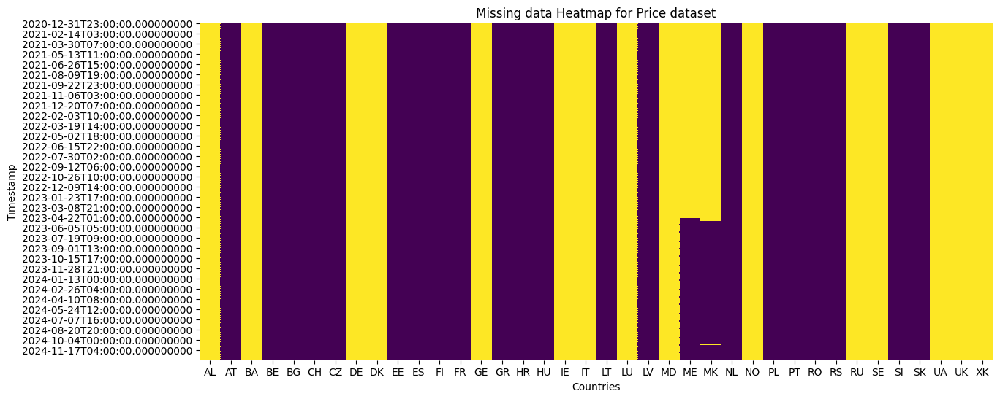

In [105]:
# plot missing data heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_price.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data Heatmap for Price dataset')
plt.xlabel('Countries')
plt.ylabel('Timestamp')
plt.show()


In [97]:
# Calculate the percentage of missing values for each column
load_missing_percentage = df_load.isna().mean() * 100


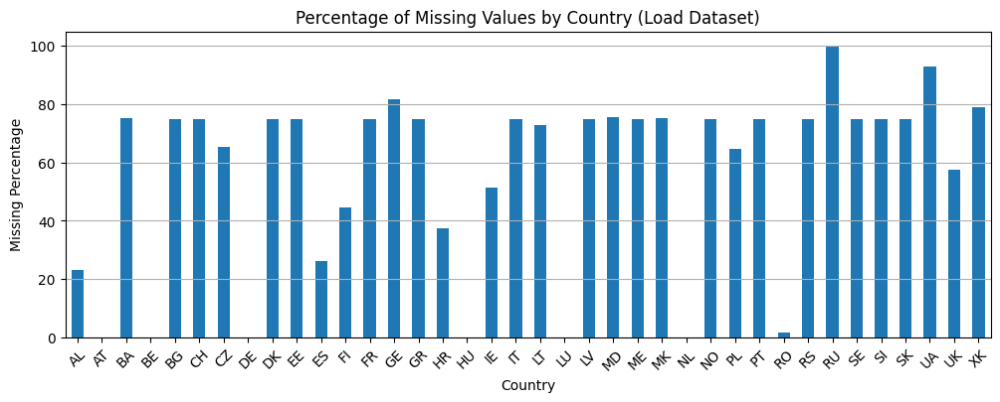

In [98]:
# Plot the missing percentage data
plt.figure(figsize=(12,4))
load_missing_percentage.plot(kind='bar')
plt.title('Percentage of Missing Values by Country (Load Dataset)')
plt.xlabel('Country')
plt.ylabel('Missing Percentage')
plt.xticks(rotation=45)
plt.grid(axis='y')

# Show the plot
plt.show()

In [99]:
load_missing_percentage = load_missing_percentage.apply(lambda x: f"{x:.2f}%")
# Add missing percentage row to the statistics dataframe
load_all_statistics.loc['missing_percentage'] = load_missing_percentage

In [100]:
load_all_statistics.to_csv("../data/new_stat/load_all_statistics.csv", sep=";")

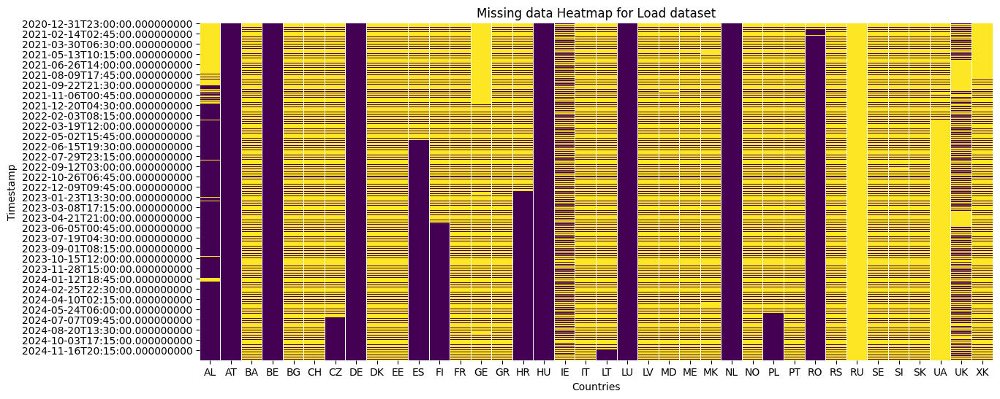

In [106]:
# plot missing data heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_load.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data Heatmap for Load dataset')
plt.xlabel('Countries')
plt.ylabel('Timestamp')
plt.show()


In [101]:
df_load.head(15)

,AL,AT,BA,BE,BG,CH,CZ,DE,DK,EE,...,PT,RO,RS,RU,SE,SI,SK,UA,UK,XK
timestamp,,,,,,,,,,,,,,,,,,,,,
2020-12-31 23:00:00+00:00,NaN,6406.0,1200.0,9486.0,3575.0,7361.0,6017.0,44973.0,3482.0,838.0,...,5939.0,5761.0,4010.0,NaN,15678.0,1128.0,2751.0,15582.0,35070.0,NaN
2020-12-31 23:15:00+00:00,NaN,6334.0,NaN,9392.0,NaN,NaN,NaN,44762.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-12-31 23:30:00+00:00,NaN,6264.0,NaN,9238.0,NaN,NaN,NaN,44419.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33917.0,NaN
2020-12-31 23:45:00+00:00,NaN,6192.0,NaN,9068.0,NaN,NaN,NaN,44123.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:00:00+00:00,NaN,6178.0,1117.0,8993.0,3385.0,7460.0,5952.0,43497.0,3406.0,810.0,...,5598.0,5496.0,4078.0,NaN,15507.0,1087.0,2640.0,15133.0,33629.0,NaN
2021-01-01 00:15:00+00:00,NaN,6101.0,NaN,8815.0,NaN,NaN,NaN,42984.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00+00:00,NaN,6009.0,NaN,8689.0,NaN,NaN,NaN,42472.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33859.0,NaN
2021-01-01 00:45:00+00:00,NaN,5940.0,NaN,8533.0,NaN,NaN,NaN,42271.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:00:00+00:00,NaN,6002.0,1003.0,8427.0,3251.0,7513.0,5942.0,41603.0,3276.0,785.0,...,5136.0,5318.0,3882.0,NaN,15130.0,1042.0,2592.0,14707.0,33092.0,NaN


In [110]:
df_price_cleaned = df_price[df_price.index.year != 2020]

In [109]:
df_load_cleaned = df_load[df_load.index.year != 2020]

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Prepare country lists
load_countries = df_load_cleaned.columns
price_countries = df_price_cleaned.columns

# Combine tab20b and tab20c to make 40 colors
colors1 = plt.cm.get_cmap("tab20b", 20).colors
colors2 = plt.cm.get_cmap("tab20c", 20).colors
full_palette = list(colors1) + list(colors2)


# Union of all countries (excluding timestamp/index)
all_countries = sorted(set(load_countries).union(set(price_countries)) - {"timestamp"})

# Step 2: Assign consistent colors
#palette = sns.color_palette("hsv", len(all_countries))
#color_map = dict(zip(all_countries, palette))
color_map = dict(zip(all_countries, full_palette[:len(all_countries)]))

# Step 3: Resample and reset index
df_load_monthly = df_load_cleaned.resample('D').mean().reset_index()
df_price_monthly = df_price_cleaned.resample('D').mean().reset_index()



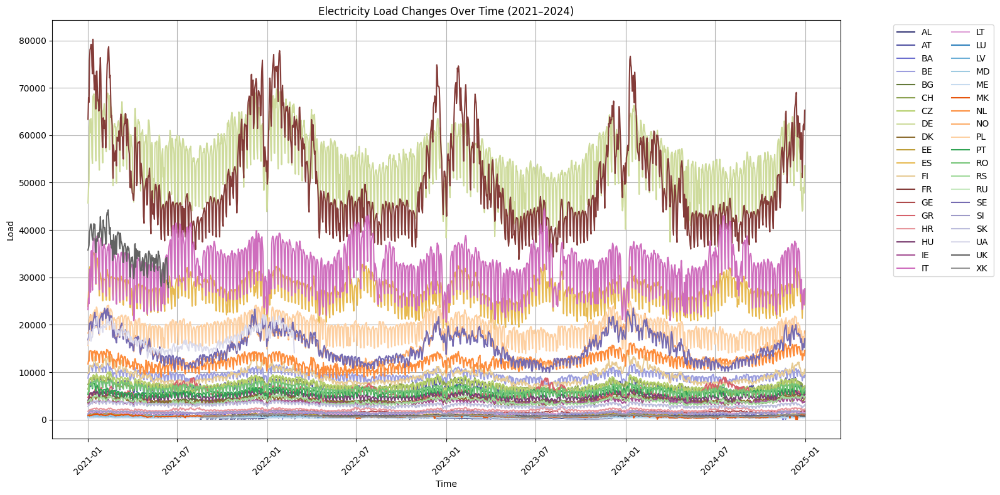

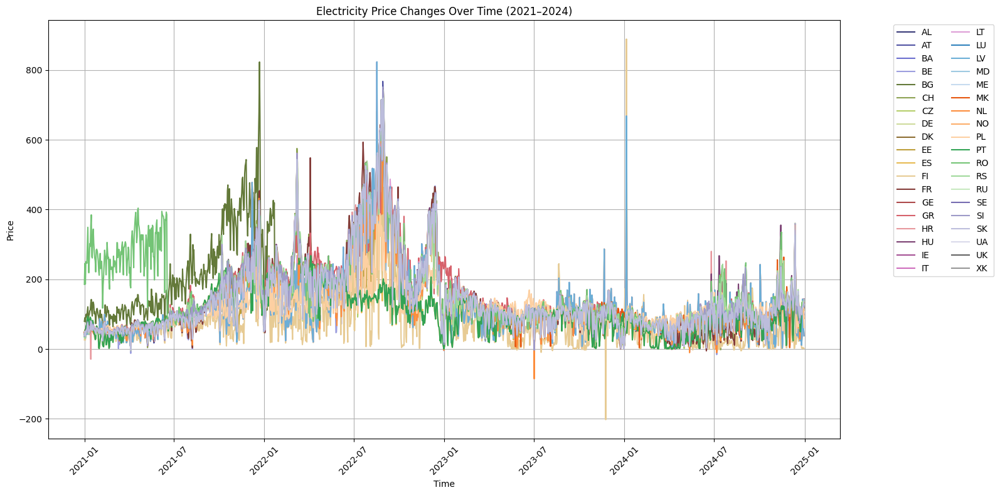

In [120]:
# Step 4: Plot Load Data
plt.figure(figsize=(16, 8))
for column in df_load_monthly.columns[1:]:  # Skip timestamp
    plt.plot(df_load_monthly["timestamp"].values, df_load_monthly[column].values,
             label=column, color=color_map.get(column, 'gray'))

plt.xlabel("Time")
plt.ylabel("Load")
plt.title("Electricity Load Changes Over Time (2021–2024)")
plt.legend(loc='upper right', bbox_to_anchor=(1.2,1),
           ncol=2)
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

# Step 5: Plot Price Data
plt.figure(figsize=(16, 8))
for column in df_price_monthly.columns[1:]:  # Skip timestamp
    plt.plot(df_price_monthly["timestamp"].values, df_price_monthly[column].values,
             label=column, color=color_map.get(column, 'gray'))

plt.xlabel("Time")
plt.ylabel("Price")
plt.title("Electricity Price Changes Over Time (2021–2024)")
plt.legend(loc='upper right', bbox_to_anchor=(1.2,1),
           ncol=2)
plt.xticks(rotation=45)
plt.grid()
plt.tight_layout()
plt.show()

In [121]:
def plot_heatmap(df, country, data_context):

    # Resample data to calculate daily mean
    daily_mean = df[country].resample('D').mean()

    daily_mean.index = pd.to_datetime(daily_mean.index).tz_localize(None)  # Remove timezone info

    # Create a figure with 4 subplots (one for each year, in rows)
    fig, axes = plt.subplots(4, 1, figsize=(14, 10))  # 4 rows, 1 column for 4 years
    fig.suptitle(f'Calendar Heatmap of Daily Mean Electricity {data_context} for {country} (2021-2024)', fontsize=16, y=1)

    # Plot each year in a separate subplot
    for i, year in enumerate(range(2021, 2025)):
        # Create a calendar heatmap for the year
        calmap.yearplot(daily_mean, year=year, cmap='viridis', fillcolor='lightgray', ax=axes[i])
        axes[i].set_title(f'Year {year}', fontsize=12, pad=10)

    # Add a colorbar for the entire figure
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])  # Position of the colorbar
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=daily_mean.min(), vmax=daily_mean.max()))
    sm._A = []  # Required for ScalarMappable
    fig.colorbar(sm, cax=cbar_ax, label=f'Daily Mean {data_context}')

    plt.show()

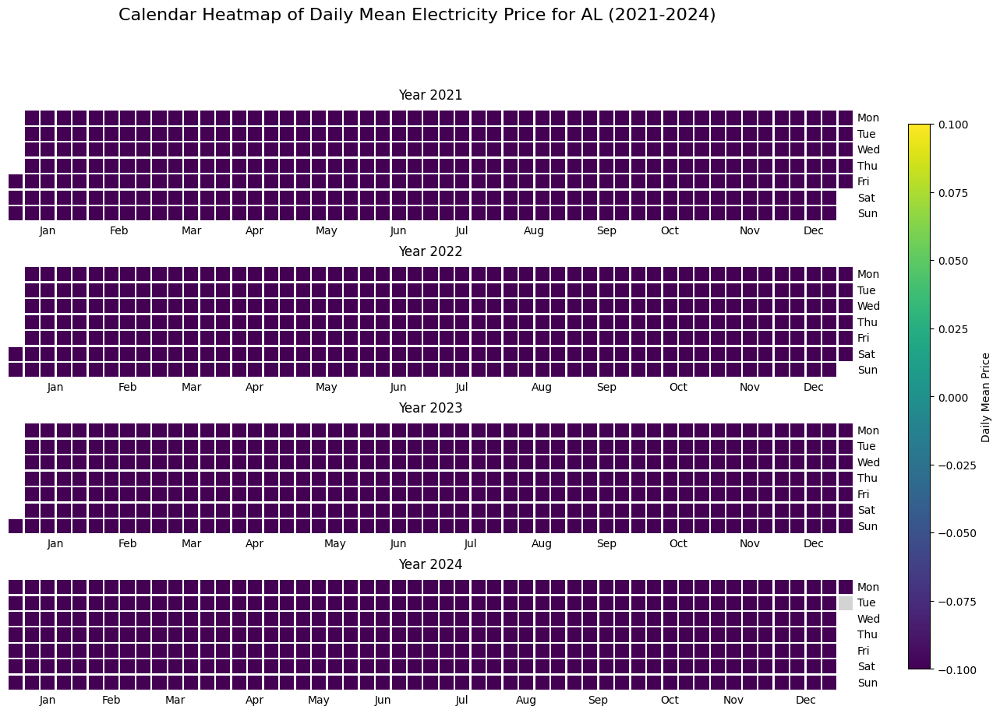

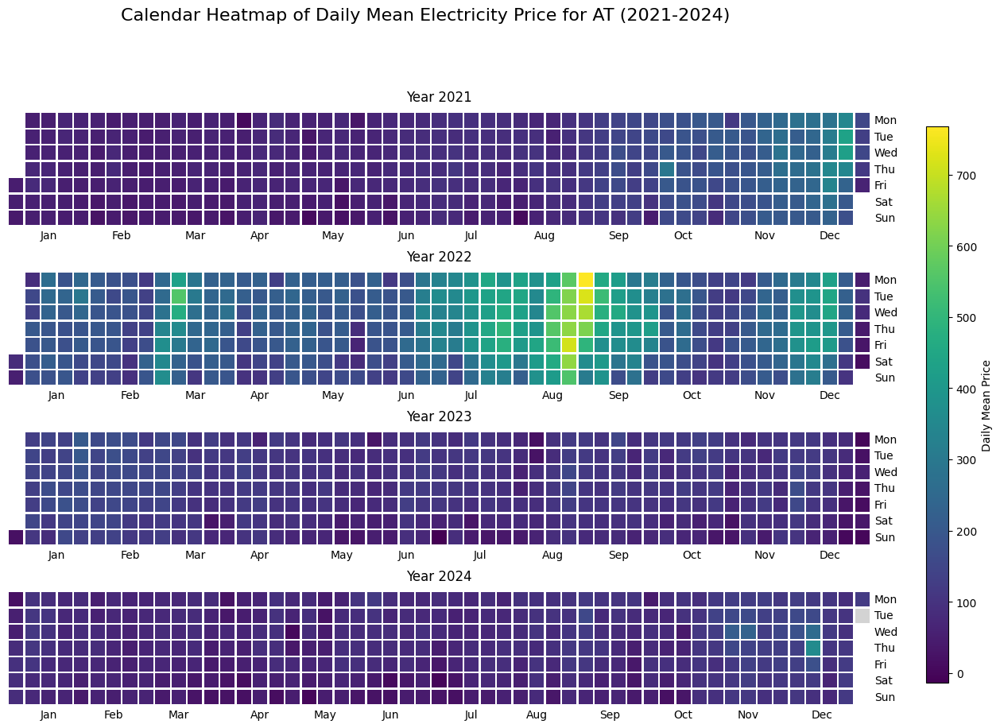

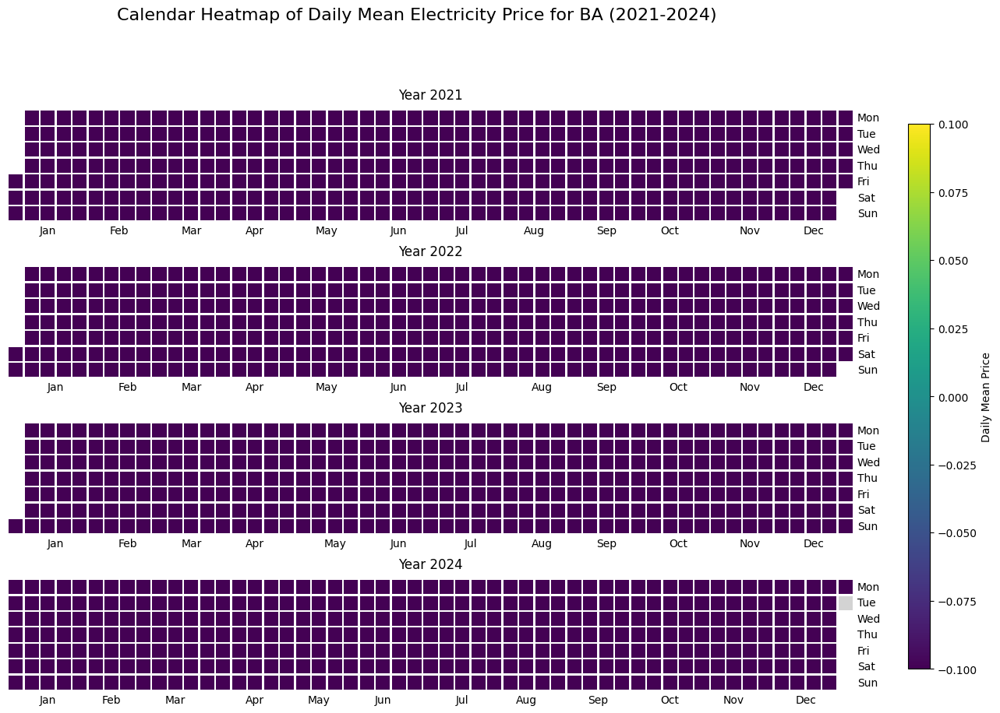

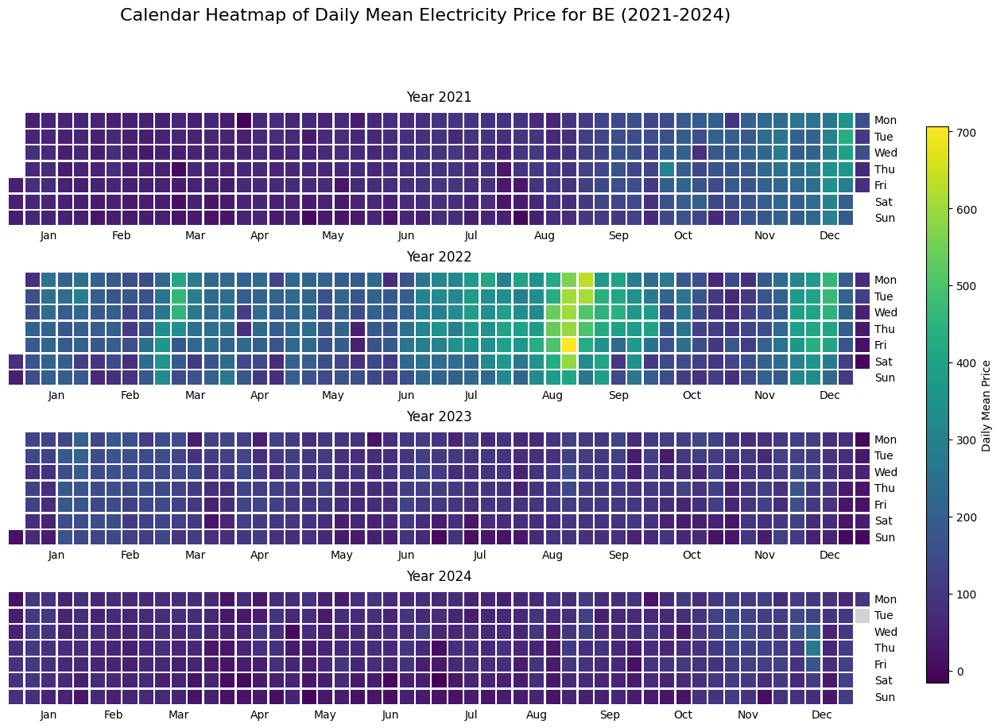

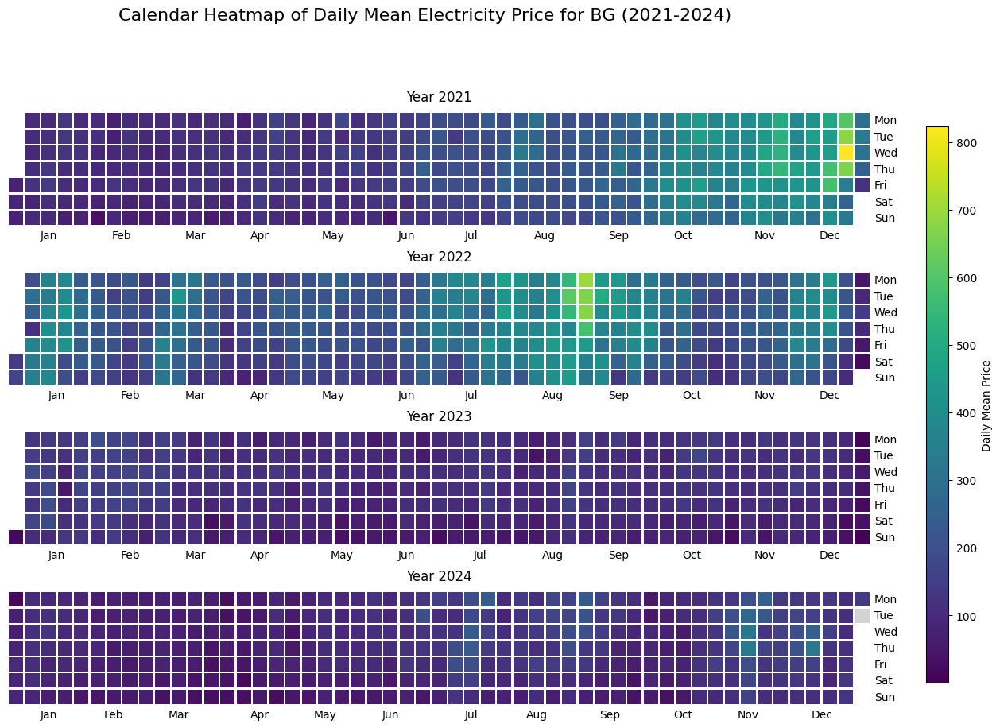

...

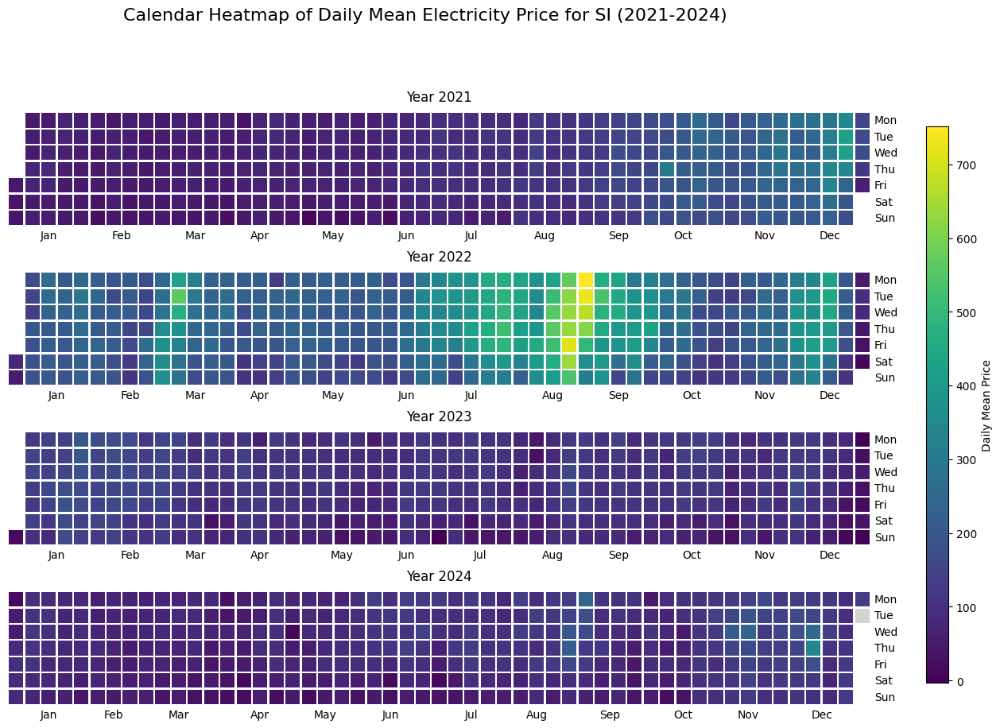

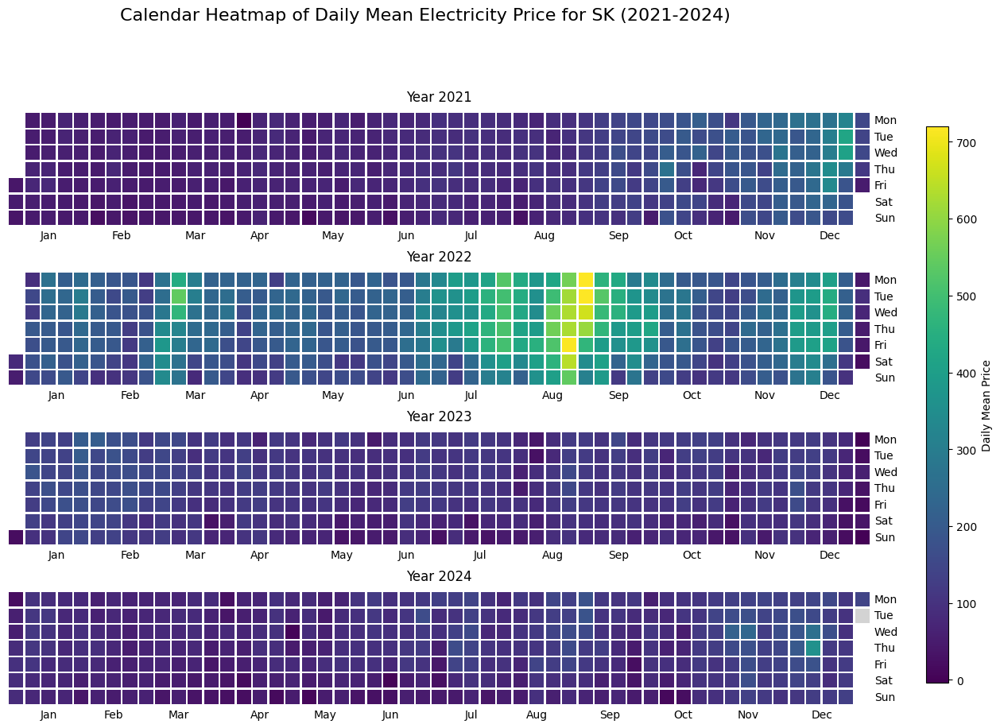

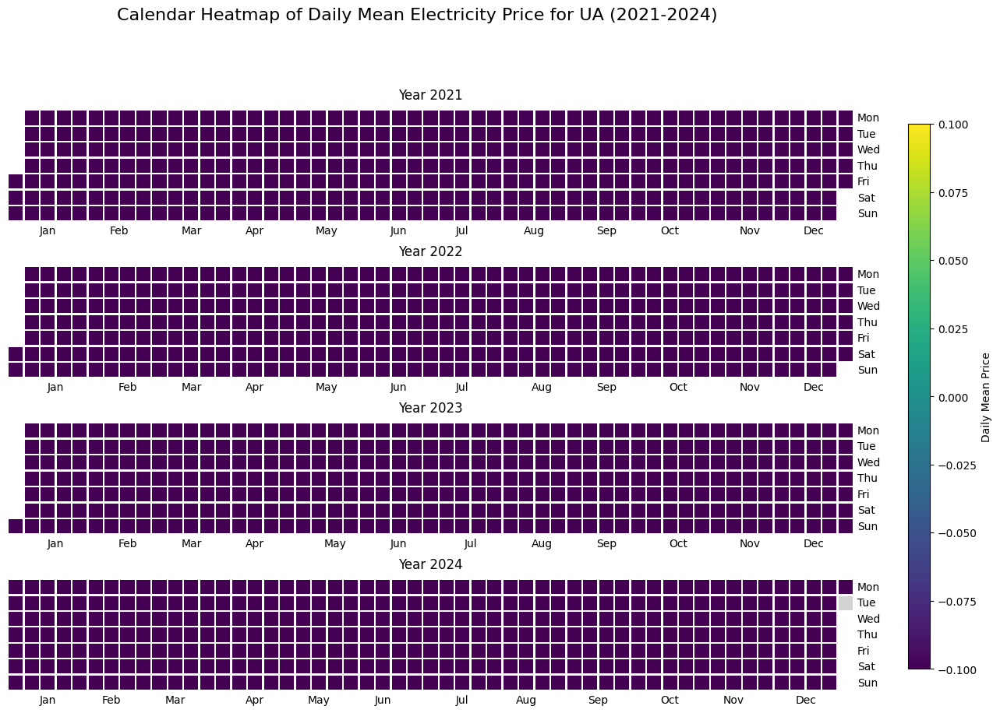

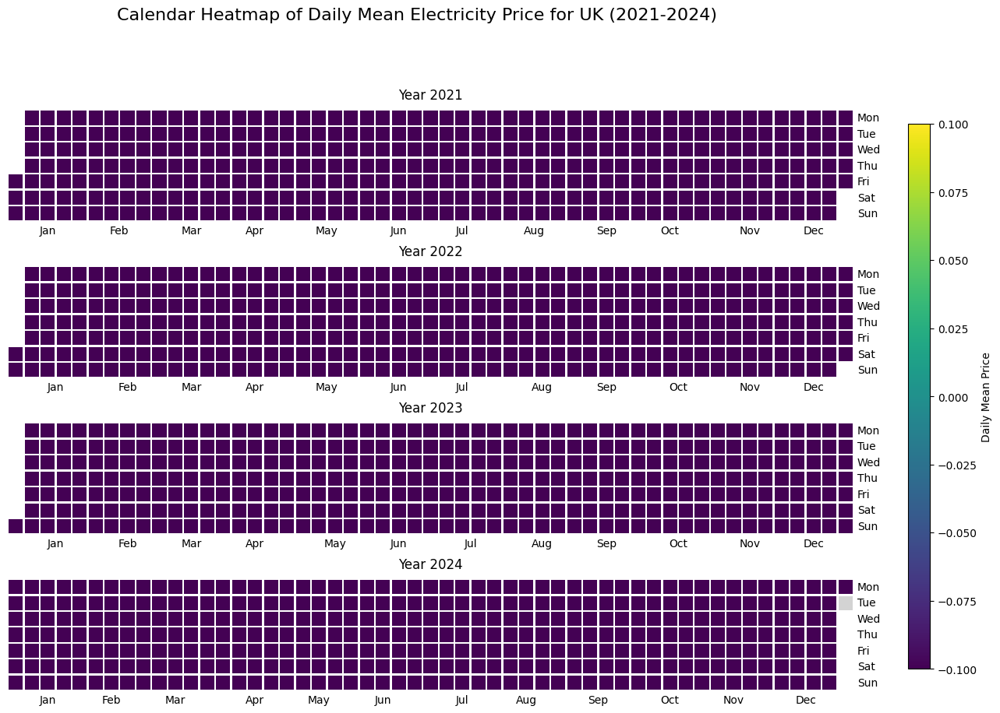

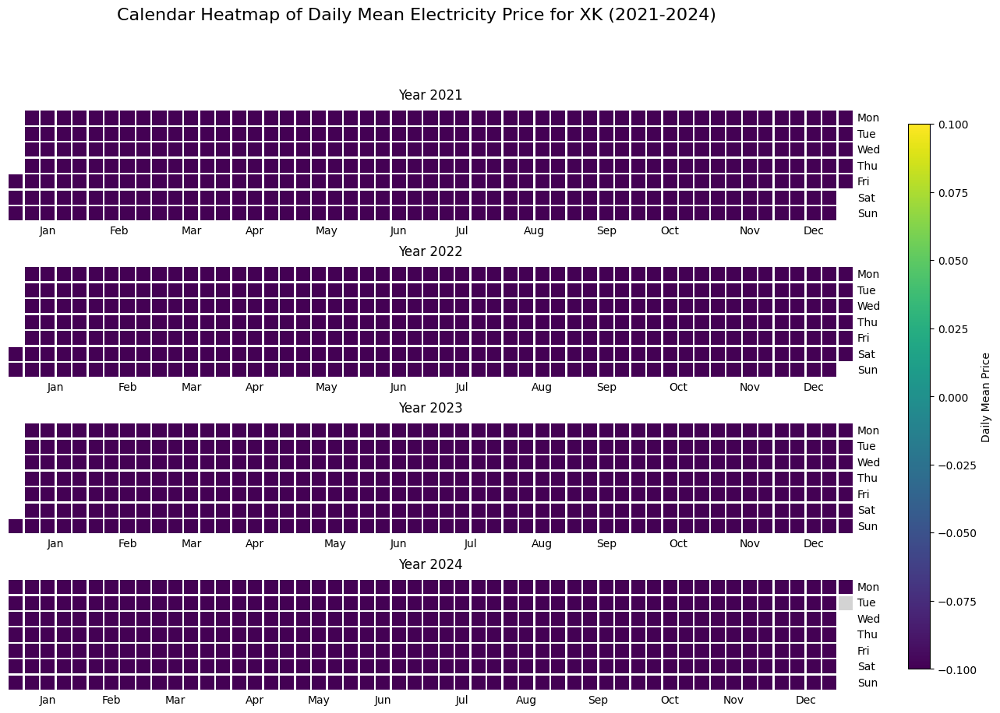

In [122]:
# Plot each country's price data distribution
cleaned_price_countries = df_price_cleaned.columns
for country_code in cleaned_price_countries:
    plot_heatmap(df_price_cleaned, country_code, data_context="Price")

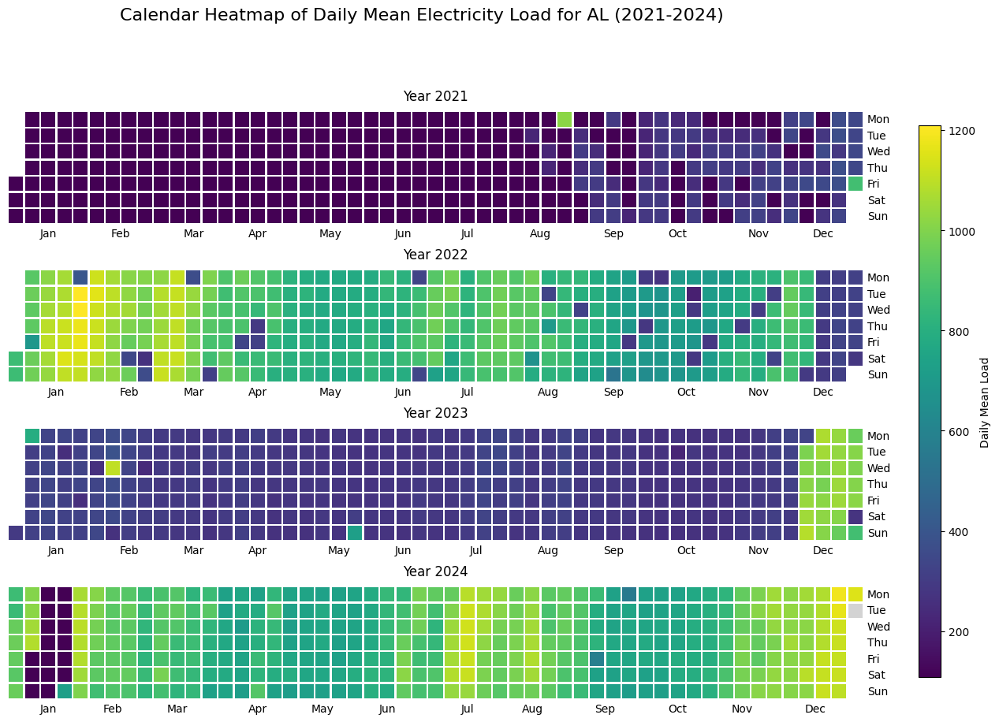

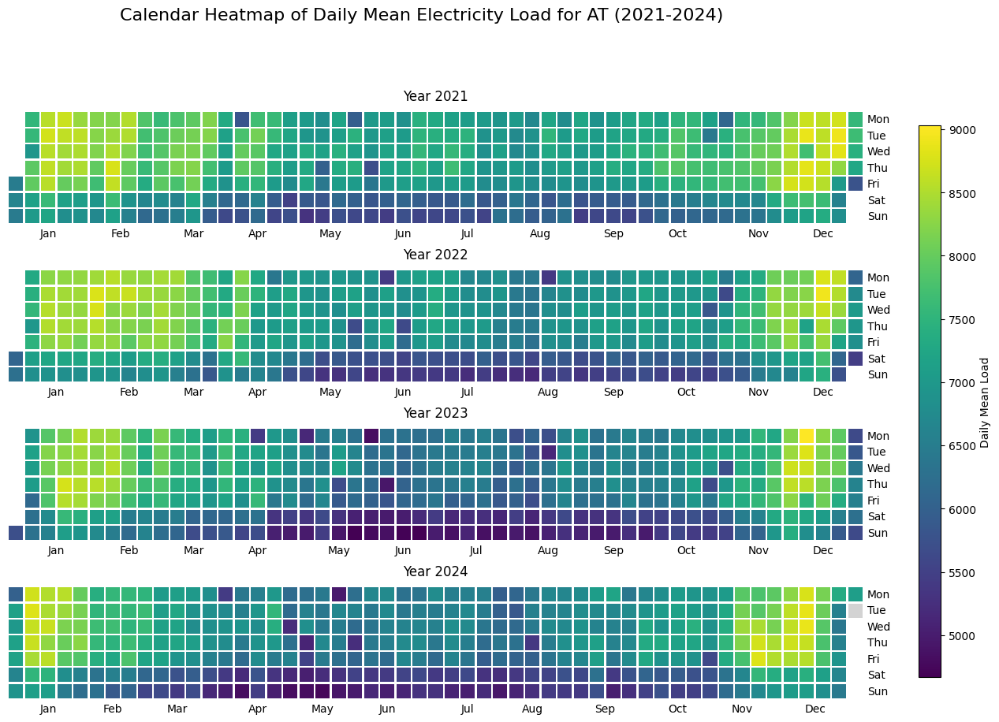

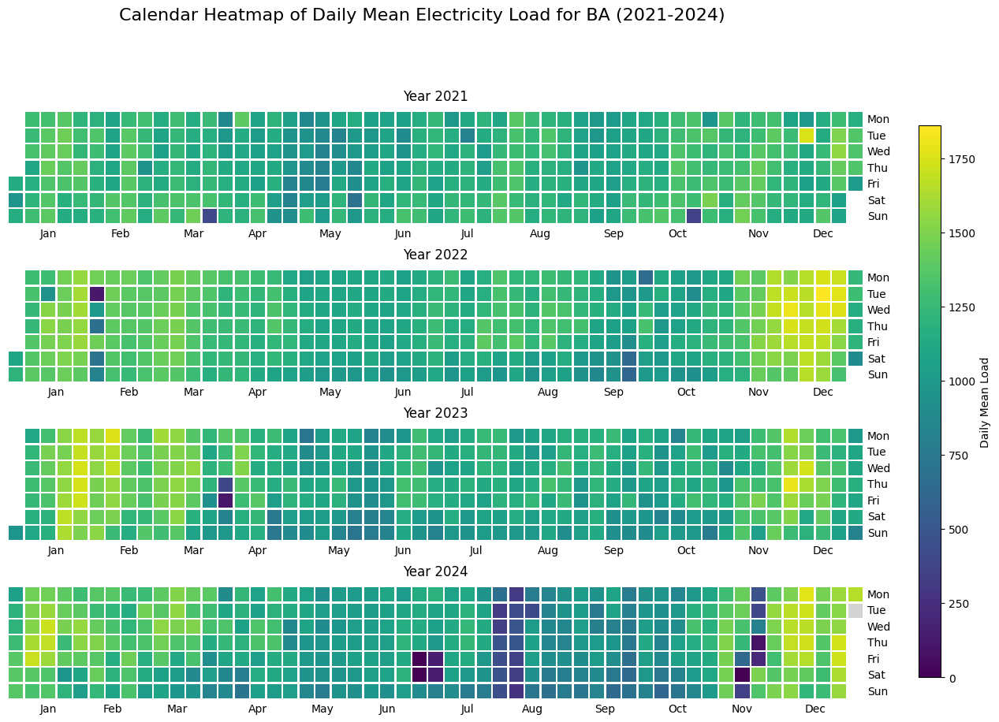

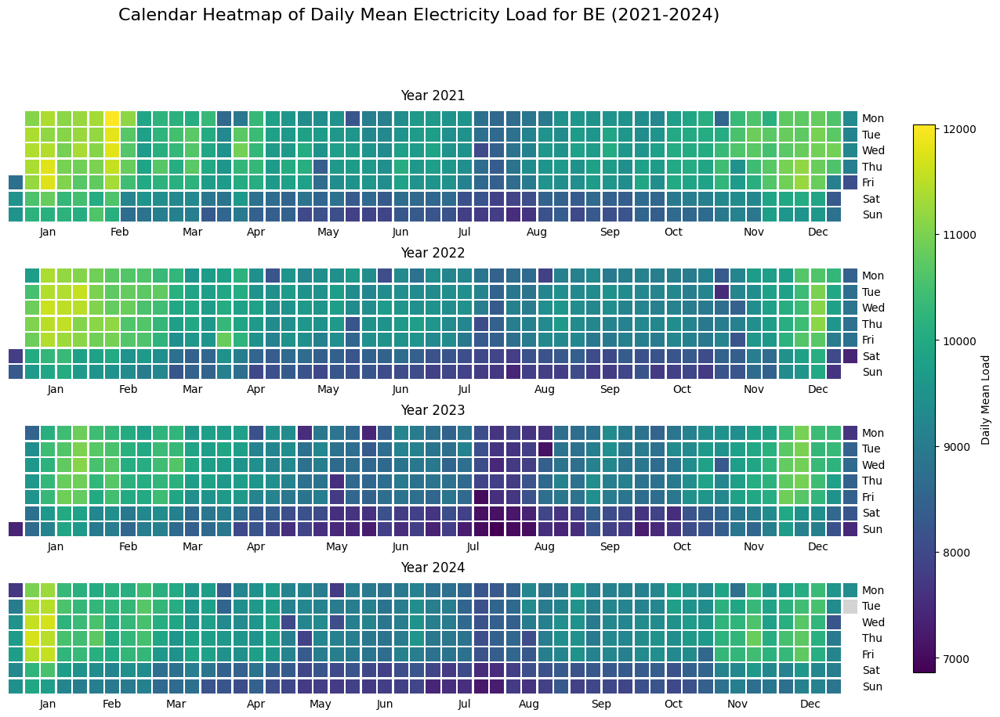

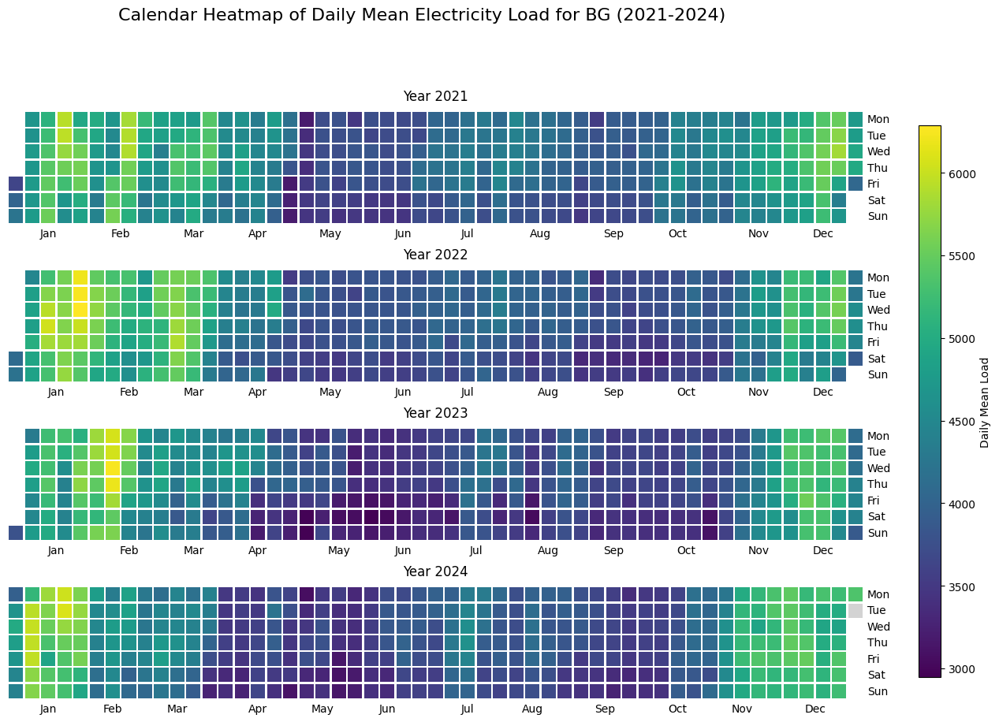

...

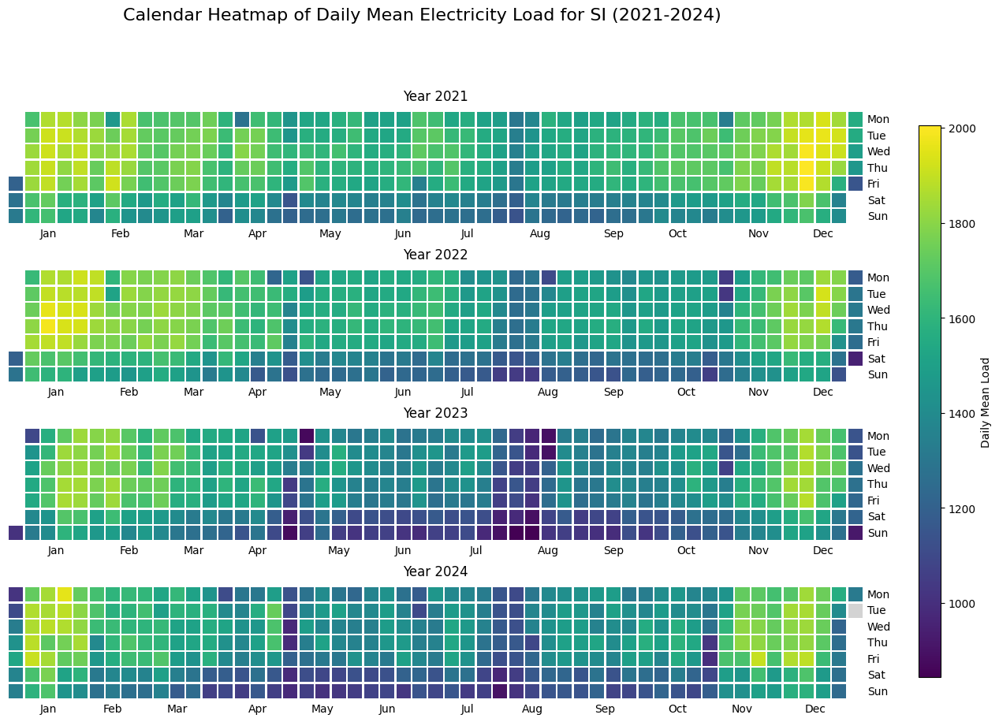

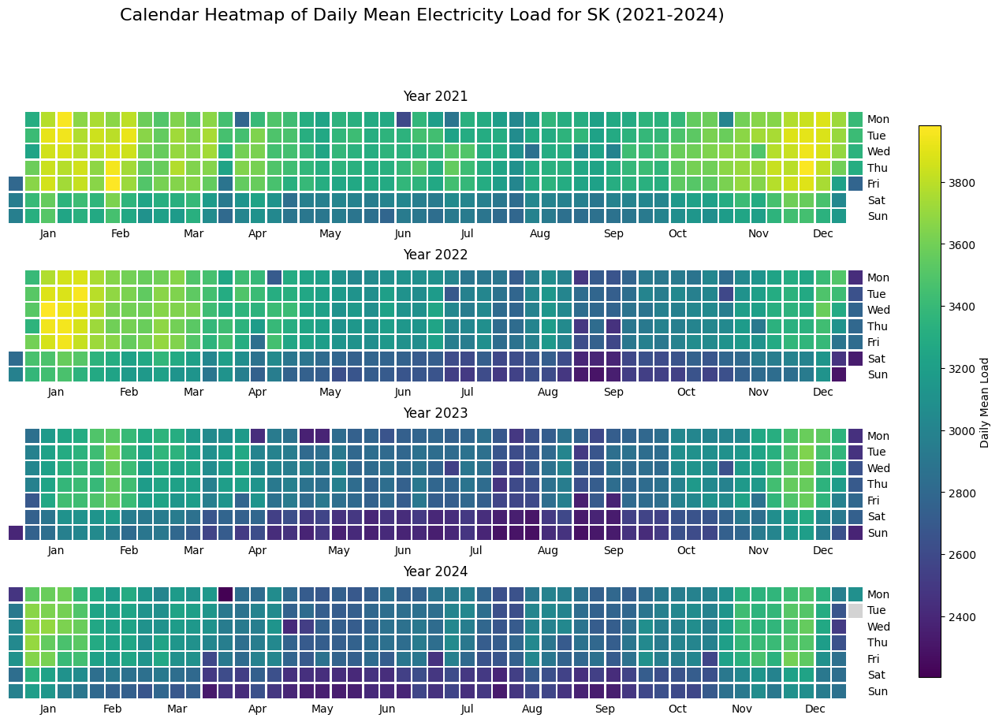

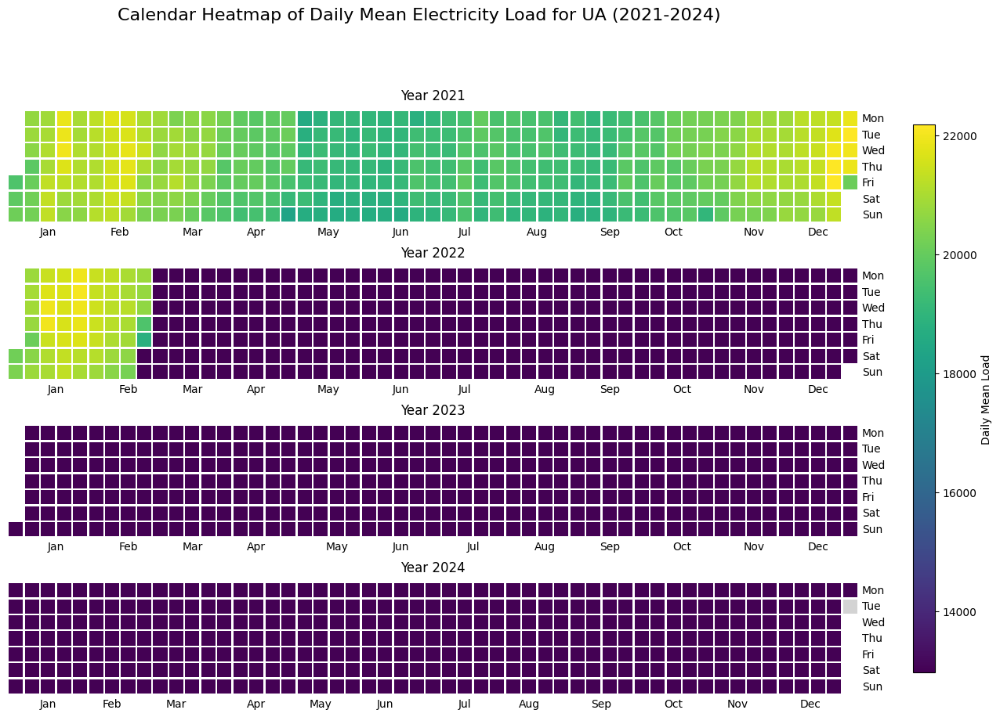

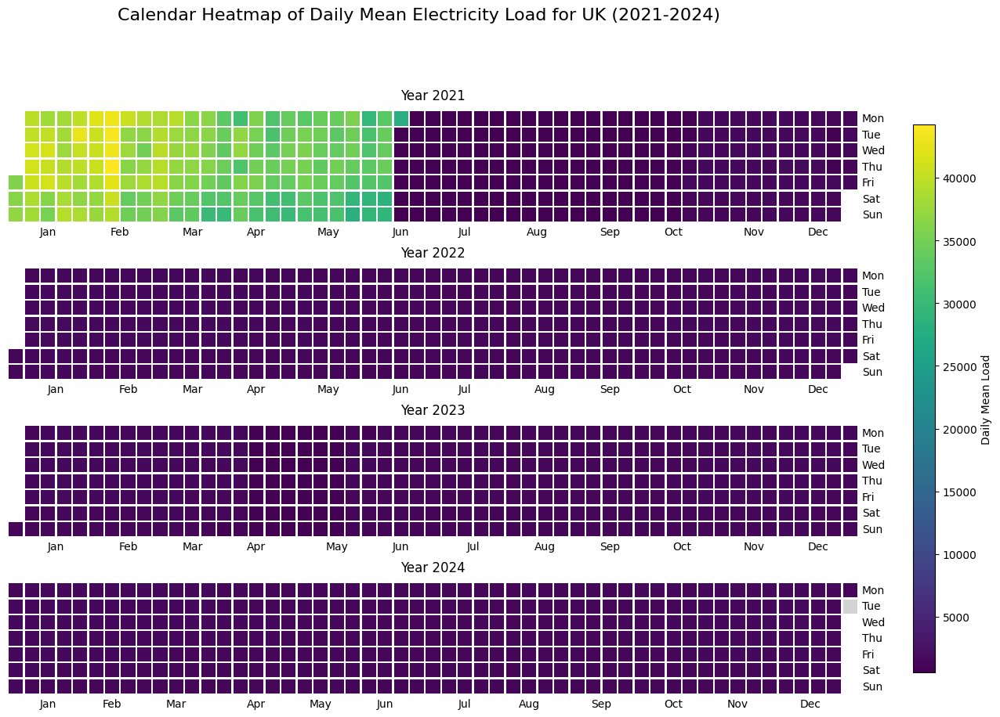

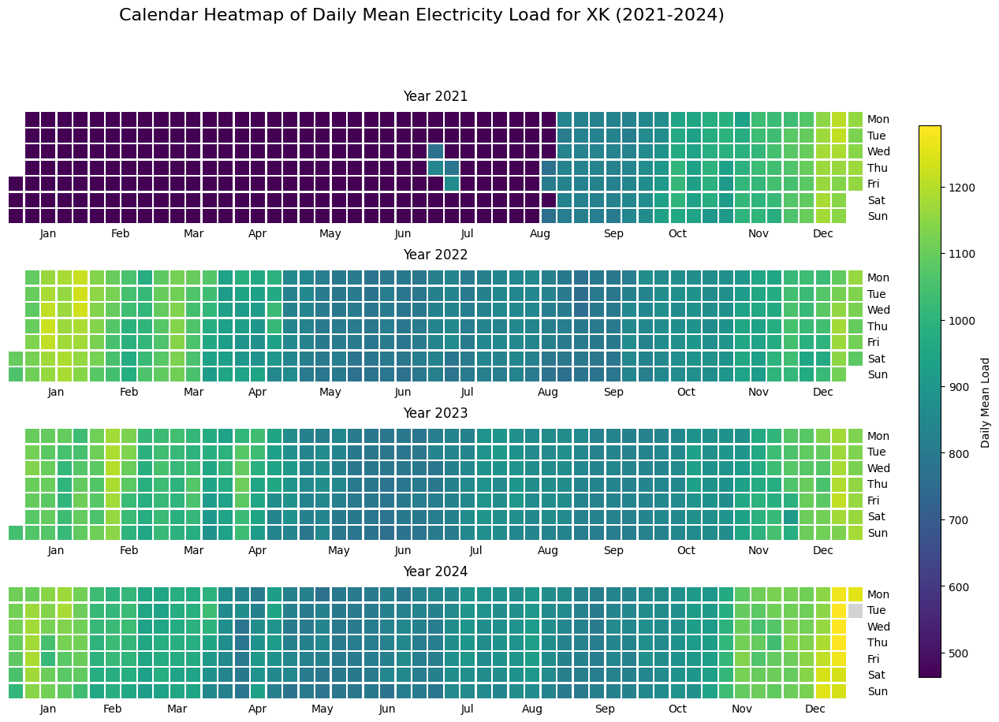

In [123]:
# Plot each country's Load data distribution
load_countries = df_load_cleaned.columns
for country_code in load_countries:
    plot_heatmap(df_load_cleaned, country_code, data_context="Load")

In [136]:
# Exclude columns with more than half missing values
price_threshold = len(df_price_cleaned) / 2
#load_threshold = len(df_load_cleaned) / 2

df_price_clean = df_price_cleaned.dropna(axis=1, thresh=price_threshold)
#df_load_clean = df_load_cleaned.dropna(axis=1, thresh=load_threshold)

In [134]:
# Exclude columns with larger missing values
df_load_clean = df_load_cleaned.drop(columns=["AL", "GE", "UK", "RU", "UA", "XK"])

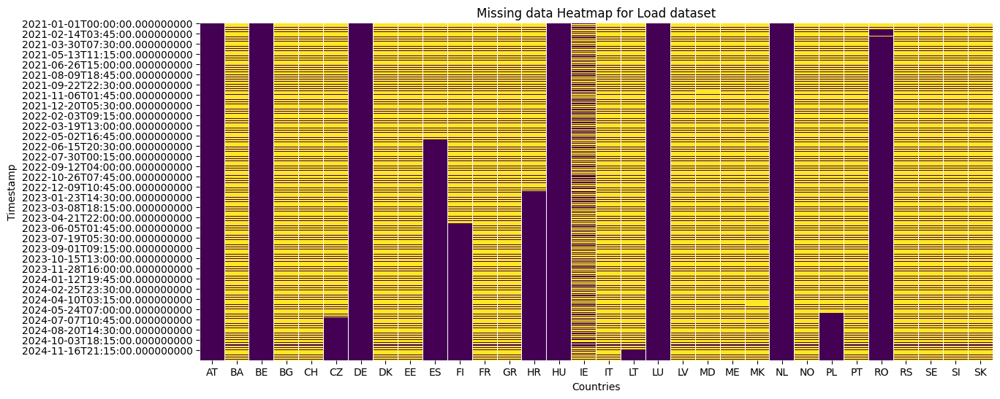

In [135]:
# plot missing data heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_load_clean.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data Heatmap for Load dataset')
plt.xlabel('Countries')
plt.ylabel('Timestamp')
plt.show()


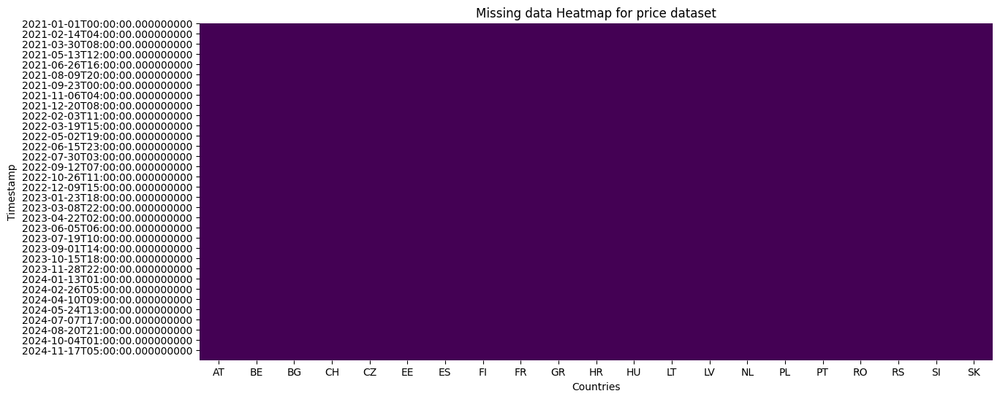

In [137]:
# plot missing data heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_price_clean.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data Heatmap for price dataset')
plt.xlabel('Countries')
plt.ylabel('Timestamp')
plt.show()

In [138]:
# Interpolate missing values for smaller gaps
df_interpolated_load = df_load_clean.interpolate(method='time')


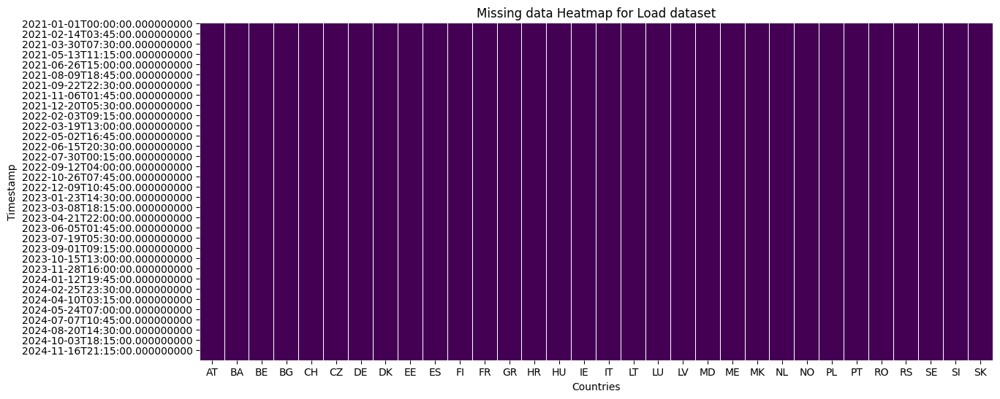

In [139]:
# plot missing data heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df_interpolated_load.isnull(), cbar=False, cmap='viridis')
plt.title('Missing data Heatmap for Load dataset')
plt.xlabel('Countries')
plt.ylabel('Timestamp')
plt.show()

In [140]:
import matplotlib.pyplot as plt

# Function to plot data distribution for a specific country by timestamp
def plot_country_data_distribution(df: pd.DataFrame, country: str, year: int, month: int, data_context: str):
    if year:
        df = df[df.index.year == year]
    if month:
        df = df[df.index.month == month]
    
    plt.figure(figsize=(16,8))

    # Plot the data
    plt.plot(df.index.to_numpy(), df[country].to_numpy(), marker='o', linestyle='-', color='b')

    # Add title and labels
    plt.title(f'{data_context} Data Distribution for {country} by Time')
    plt.xlabel('Time')
    plt.ylabel(f'{country} Values')

    # Show the plot
    plt.grid(True)
    plt.show()


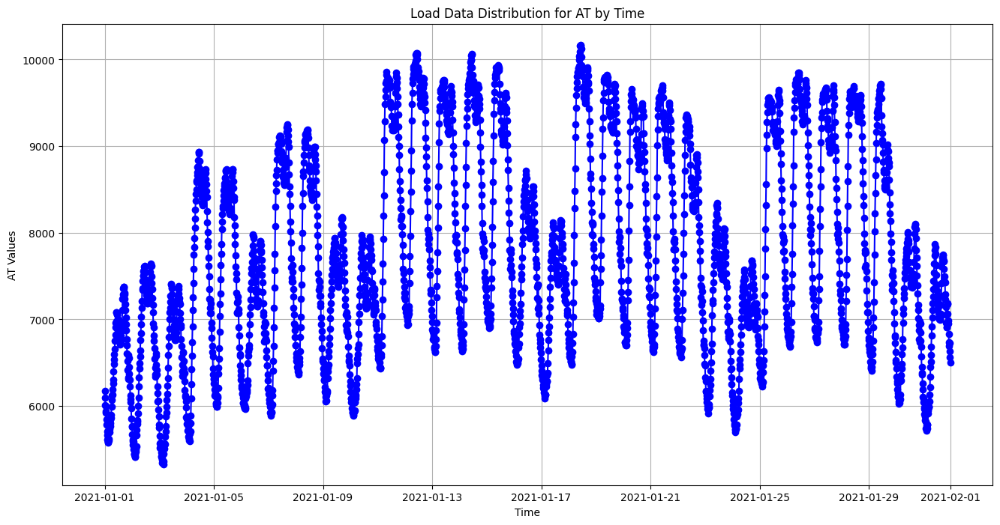

In [141]:
# Plot data distribution for country-specific
plot_country_data_distribution(df=df_interpolated_load, country='AT', year=2021, month=1, data_context="Load")

In [142]:
df_interpolated_load.to_csv("../data/new_stat/electricity_loads_final_cleaned.csv", sep=";", index=False)

In [143]:
df_price_clean.to_csv("../data/new_stat/electricity_price_final_cleaned.csv", sep=";", index=False)

In [144]:
price_final_statistics = df_price_clean.describe(include='all')
print("Price final Statistics:\n", price_final_statistics)

Price final Statistics:
                  AT            BE            BG            CH            CZ  \
count  34971.000000  34971.000000  34971.000000  34971.000000  34971.000000   
mean     138.159098    129.301184    170.373310    145.153680    133.678560   
std      112.138293    108.156423    130.274326    114.466939    107.387683   
min     -500.000000   -140.000000    -45.000000   -427.510000   -138.750000   
25%       71.015000     63.930000     90.000000     71.620000     70.775000   
50%      103.230000     97.340000    127.900000    105.430000    101.330000   
75%      170.100000    164.475000    213.020000    188.860000    160.840000   
max      919.640000    871.000000   1061.040000    871.610000    871.000000   

                 EE            ES            FI            FR            GR  \
count  34971.000000  34971.000000  34971.000000  34971.000000  34971.000000   
mean     114.545606    107.449158     82.196231    135.133928    154.023647   
std      101.133923     71

In [145]:
load_final_statistics = df_interpolated_load.describe(include='all')
print("Load final Statistics:\n", load_final_statistics)

Load final Statistics:
                   AT             BA             BE             BG  \
count  139879.000000  139879.000000  139879.000000  139879.000000   
mean     6887.211819    1180.729149    9301.298744    4250.121239   
std      1301.184737     354.746559    1333.656525     859.273122   
min      4009.000000       0.000000    5877.000000      31.000000   
25%      5844.000000     966.750000    8256.000000    3643.750000   
50%      6848.000000    1199.000000    9297.000000    4134.000000   
75%      7811.000000    1397.250000   10254.000000    4784.125000   
max     10388.000000   16591.000000   13562.000000    7198.000000   

                  CH             CZ             DE             DK  \
count  139879.000000  139879.000000  139879.000000  139879.000000   
mean     7097.063462    7215.653238   54495.978024    4046.370286   
std      1056.249810    1332.334977    9593.640317     721.499982   
min      2743.000000    3798.000000   27933.000000    2148.000000   
25%      

In [146]:
def plot_country_statistics(df, country, data_context):
    """
    Generate boxplots for yearly, weekday, and monthly electricity prices for a specific country.

    Parameters:
        data (pd.DataFrame): The input dataframe containing electricity price data.
        country (str): The country code (e.g., 'AT', 'BE').
        data_context (str): Load or Price.
    """
    # Extract the data for the specified country
    country_data=df[country]

    # Remove timezone and convert timestamp
    country_data.index = pd.to_datetime(country_data.index).tz_localize(None)

    # Create a figure with 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(14, 18))
    fig.suptitle(f'Electricity {data_context} Statistics for {country}', fontsize=16, y=1.02)

    # 1. Yearly Boxplot
    yearly_data = country_data.reset_index()
    yearly_data['Year'] = yearly_data['timestamp'].dt.year
    sns.boxplot(x='Year', hue='Year', y=country, data=yearly_data, ax=axes[0], palette='viridis')
    axes[0].set_title(f'Yearly Electricity {data_context} Distribution')
    axes[0].set_xlabel('Year')
    axes[0].set_ylabel(f'{data_context}')

    # Add median labels for yearly boxplot
    yearly_medians = yearly_data.groupby('Year')[country].median()
    for i, year in enumerate(yearly_medians.index):
        axes[0].text(i, yearly_medians[year] + 5, f'Med: {yearly_medians[year]:.2f}',
                     ha='center', va='bottom', fontsize=10, color='red')

    # 2. Weekday Boxplot
    weekday_data = country_data.reset_index()
    weekday_data['Weekday'] = weekday_data['timestamp'].dt.weekday
    weekday_data['Weekday'] = weekday_data['Weekday'].map({
        0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'
    })
    sns.boxplot(x='Weekday', hue='Weekday', y=country, data=weekday_data, ax=axes[1], palette='viridis', order=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
    axes[1].set_title(f'Weekday Electricity {data_context} Distribution')
    axes[1].set_xlabel('Weekday')
    axes[1].set_ylabel(f'{data_context}')

    # Add median labels for weekday boxplot
    weekday_medians = weekday_data.groupby('Weekday')[country].median()
    for i, weekday in enumerate(weekday_medians.index):
        axes[1].text(i, weekday_medians[weekday] + 5, f'Med: {weekday_medians[weekday]:.2f}',
                     ha='center', va='bottom', fontsize=10, color='red')

    # 3. Monthly Boxplot
    monthly_data = country_data.reset_index()
    monthly_data['Month'] = monthly_data['timestamp'].dt.month_name()
    sns.boxplot(x='Month', hue='Month', y=country, data=monthly_data, ax=axes[2], palette='viridis', order=[
        'January', 'February', 'March', 'April', 'May', 'June',
        'July', 'August', 'September', 'October', 'November', 'December'
    ])
    axes[2].set_title(f'Monthly Electricity {data_context} Distribution')
    axes[2].set_xlabel('Month')
    axes[2].set_ylabel(f'{data_context}')
    axes[2].tick_params(axis='x', rotation=45)

     # Add median labels for monthly boxplot
    monthly_medians = monthly_data.groupby('Month')[country].median()
    for i, month in enumerate(monthly_medians.index):
        axes[2].text(i, monthly_medians[month] + 5, f'Med: {monthly_medians[month]:.2f}',
                     ha='center', va='bottom', fontsize=10, color='red')

    # Adjust layout and display
    plt.tight_layout()
    plt.show()



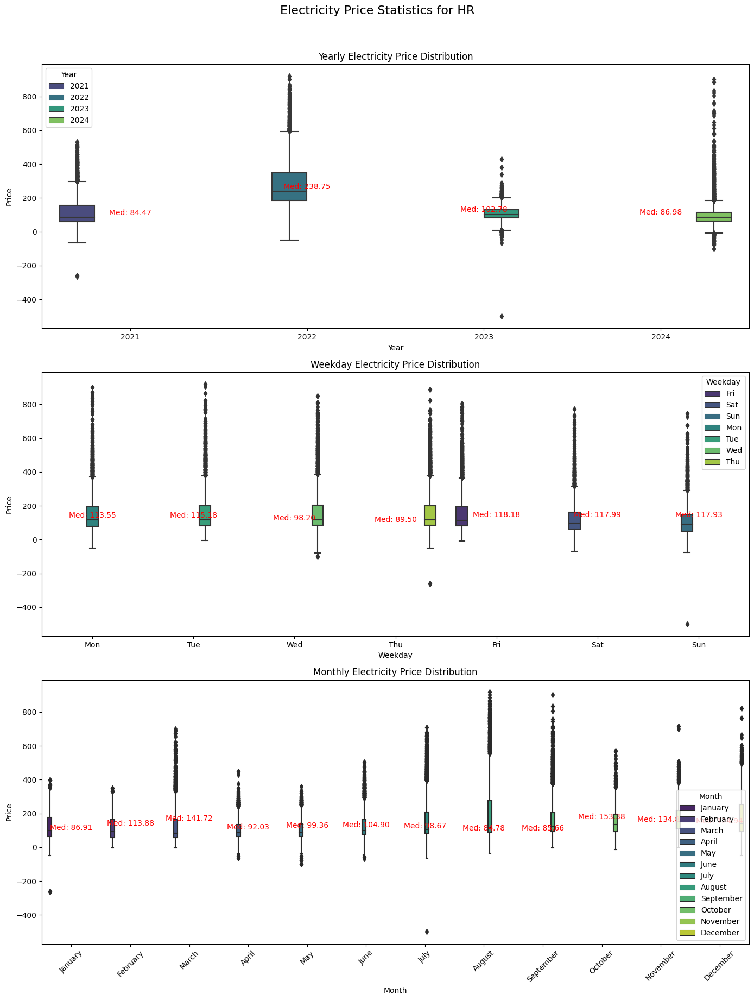

In [147]:
# Plot country statistics in interms of weekday, month, year
plot_country_statistics(df_price_clean, 'HR', data_context="Price")

In [148]:
# Function to compare statistics between business days and weekends for each country
def compare_statistics(df: pd.DataFrame):

    # Separate business days and weekends
    business_days = df[df.index.dayofweek < 5]
    weekend_days = df[df.index.dayofweek >= 5]

    # Get statistics for business days and weekends
    business_days_stats = business_days.describe(include='all')
    weekends_stats = weekend_days.describe(include='all')

    # Print statistics
    print(f"Statistics for Business Days (Mon-Fri):")
    print(business_days_stats)
    print("\n")
    print(f"Statistics for Weekends (Sat-Sun):")
    print(weekends_stats)
    print("\n")

In [149]:
compare_statistics(df_price_clean)

Statistics for Business Days (Mon-Fri):
                 AT            BE            BG            CH            CZ  \
count  24985.000000  24985.000000  24985.000000  24985.000000  24985.000000   
mean     149.043980    139.068071    183.039156    154.141807    145.094913   
std      116.689817    111.653351    135.562800    118.433458    111.835822   
min     -105.990000   -123.180000     -0.010000    -15.400000   -114.960000   
25%       77.260000     70.240000     97.080000     76.680000     77.850000   
50%      109.380000    102.120000    136.610000    110.160000    107.970000   
75%      181.970000    176.080000    222.000000    197.780000    175.170000   
max      919.640000    871.000000   1061.040000    871.610000    871.000000   

                 EE            ES            FI            FR            GR  \
count  24985.000000  24985.000000  24985.000000  24985.000000  24985.000000   
mean     125.734629    112.748885     91.804935    145.299449    161.230380   
std      10

In [150]:
compare_statistics(df_interpolated_load)

Statistics for Business Days (Mon-Fri):
                 AT            BA            BE            BG            CH  \
count  99928.000000  99928.000000  99928.000000  99928.000000  99928.000000   
mean    7230.157714   1207.212925   9602.753693   4333.473748   7224.910423   
std     1267.052931    361.054045   1320.589840    863.582706   1077.046602   
min     4009.000000      0.000000   5977.000000   2525.000000   2743.000000   
25%     6296.000000    995.000000   8616.000000   3728.500000   6492.000000   
50%     7274.000000   1224.000000   9700.000000   4215.250000   7223.000000   
75%     8119.000000   1420.000000  10505.000000   4874.000000   7940.500000   
max    10388.000000  16591.000000  13562.000000   7198.000000  10437.000000   

                 CZ            DE            DK            EE            ES  \
count  99928.000000  99928.000000  99928.000000  99928.000000  99928.000000   
mean    7529.453051  57241.044332   4186.994514    960.514345  27965.717629   
std     129

In [151]:
preprocessed_load_statistics = df_interpolated_load.describe(include='all')
print("Price Statistics:\n", preprocessed_load_statistics)

Price Statistics:
                   AT             BA             BE             BG  \
count  139879.000000  139879.000000  139879.000000  139879.000000   
mean     6887.211819    1180.729149    9301.298744    4250.121239   
std      1301.184737     354.746559    1333.656525     859.273122   
min      4009.000000       0.000000    5877.000000      31.000000   
25%      5844.000000     966.750000    8256.000000    3643.750000   
50%      6848.000000    1199.000000    9297.000000    4134.000000   
75%      7811.000000    1397.250000   10254.000000    4784.125000   
max     10388.000000   16591.000000   13562.000000    7198.000000   

                  CH             CZ             DE             DK  \
count  139879.000000  139879.000000  139879.000000  139879.000000   
mean     7097.063462    7215.653238   54495.978024    4046.370286   
std      1056.249810    1332.334977    9593.640317     721.499982   
min      2743.000000    3798.000000   27933.000000    2148.000000   
25%      6379.

In [152]:
preprocessed_load_statistics.to_csv("../data/new_stat/preprocessed_load_statistics.csv", sep=";", index=False)

In [153]:
preprocessed_price_statistics = df_price_clean.describe(include='all')
print("Price Statistics:\n", preprocessed_price_statistics)

Price Statistics:
                  AT            BE            BG            CH            CZ  \
count  34971.000000  34971.000000  34971.000000  34971.000000  34971.000000   
mean     138.159098    129.301184    170.373310    145.153680    133.678560   
std      112.138293    108.156423    130.274326    114.466939    107.387683   
min     -500.000000   -140.000000    -45.000000   -427.510000   -138.750000   
25%       71.015000     63.930000     90.000000     71.620000     70.775000   
50%      103.230000     97.340000    127.900000    105.430000    101.330000   
75%      170.100000    164.475000    213.020000    188.860000    160.840000   
max      919.640000    871.000000   1061.040000    871.610000    871.000000   

                 EE            ES            FI            FR            GR  \
count  34971.000000  34971.000000  34971.000000  34971.000000  34971.000000   
mean     114.545606    107.449158     82.196231    135.133928    154.023647   
std      101.133923     71.12223

In [154]:
preprocessed_price_statistics.to_csv("../data/new_stat/preprocessed_price_statistics.csv", sep=";", index=False)

In [155]:
preprocessed_price_statistics

,AT,BE,BG,CH,CZ,EE,ES,FI,FR,GR,...,HU,LT,LV,NL,PL,PT,RO,RS,SI,SK
count,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,...,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000,34971.000000
mean,138.159098,129.301184,170.373310,145.153680,133.678560,114.545606,107.449158,82.196231,135.133928,154.023647,...,148.440436,125.784206,124.417307,129.679583,115.538450,107.957156,171.939119,148.381078,146.450491,141.497816
std,112.138293,108.156423,130.274326,114.466939,107.387683,101.133923,71.122233,97.408279,122.509902,108.831709,...,118.166201,113.655935,112.159244,106.006022,63.718906,70.708422,123.298951,113.863283,115.177556,114.136158
min,-500.000000,-140.000000,-45.000000,-427.510000,-138.750000,-60.040000,-2.000000,-500.000000,-134.940000,-1.020000,...,-500.000000,-56.550000,-56.550000,-500.000000,-61.640000,-2.000000,-106.360000,0.000000,-500.000000,-146.130000
25%,71.015000,63.930000,90.000000,71.620000,70.775000,55.080000,60.120000,22.160000,59.990000,82.540000,...,75.445000,60.045000,59.250000,67.645000,78.455000,61.095000,89.850000,75.365000,75.135000,72.860000
50%,103.230000,97.340000,127.900000,105.430000,101.330000,92.780000,98.600000,53.430000,96.630000,118.110000,...,111.210000,96.190000,96.000000,99.940000,102.870000,98.730000,133.200000,111.350000,110.000000,105.150000
75%,170.100000,164.475000,213.020000,188.860000,160.840000,142.340000,144.770000,105.030000,177.795000,203.805000,...,186.840000,150.560000,150.000000,164.180000,138.050000,145.000000,230.105000,189.520000,185.500000,174.830000
max,919.640000,871.000000,1061.040000,871.610000,871.000000,4000.000000,700.000000,1896.000000,2987.780000,942.000000,...,1047.100000,4000.000000,4000.000000,872.960000,771.000000,651.000000,1021.610000,899.970000,1022.270000,900.230000


In [156]:
preprocessed_price_statistics.to_latex("../data/new_stat/price_summary_table.tex", caption="Descriptive Statistics for Electricity Price Dataset", label="tab:price_stats")
preprocessed_load_statistics.to_latex("../data/new_stat/load_summary_table.tex", caption="Descriptive Statistics for Electricity Load Dataset", label="tab:load_stats")


In [159]:
# Function to split the dataframe and save to files
def split_timeseries(df, data_context):
    df = df.reset_index()
    percentages = [2, 5, 10, 20, 50, 100]
    for p in percentages:
        n = int(len(df) * (p / 100))
        split_df = df.tail(n)
        print(f'percent:{p}%, {data_context} shape: {split_df.shape}' )
        split_df.to_csv(f'../data/new_stat/{data_context}_subsampled_{p}_percent.csv', index=False)



In [160]:
# Split the dataframe and save to files
split_timeseries(df_interpolated_load,"load")


percent:2%, load shape: (2797, 33)
percent:5%, load shape: (6993, 33)
percent:10%, load shape: (13987, 33)
percent:20%, load shape: (27975, 33)
percent:50%, load shape: (69939, 33)
percent:100%, load shape: (139879, 33)


In [161]:
split_timeseries(df_price_clean,"price")

percent:2%, price shape: (699, 22)
percent:5%, price shape: (1748, 22)
percent:10%, price shape: (3497, 22)
percent:20%, price shape: (6994, 22)
percent:50%, price shape: (17485, 22)
percent:100%, price shape: (34971, 22)


In [148]:
## Generate training dataset 
def generate_training_dataset(df, data_context, T=24):
    """
    Generate 2%, 5%, 10%, 20%, 100% training dataset for each data

    Parameters:
        data (pd.DataFrame): The input dataframe containing electricity price/load data.
        data_context (str): Load or Price.
        T (int): The sequences length (e.g., T=24 for hourly data, each sequence would represent a day's worth of data).
    """

    N = df.shape[0]
    TEST_PERC = 0.00
    TRAIN_PERC = 1- TEST_PERC

    perc_of_train_data = [2, 5, 10, 20, 100]

    frac_datasets = []
    for p in perc_of_train_data: 

        num_test = int(N * TEST_PERC)   # to be held-out
        orig_num_train = N - num_test

        test_data = df.tail(num_test)  # to be used for evaluation later

        orig_train_data = df.loc[np.arange(orig_num_train)]
        print(orig_train_data.shape)

        num_train_frac = int(orig_num_train * p / 100.)
        print(f'Num train steps for p = {p} is {num_train_frac}')

        train_data_frac = df.tail(num_train_frac) 
        frac_datasets.append(train_data_frac)
        print(f'frac:{p}%, train_data_frac shape: {train_data_frac.shape}' )
    

    for i, d in enumerate(frac_datasets):
        frac_datasets[i] = d.values.reshape(1, *d.shape)
        print("reshaped: ", frac_datasets[i].shape)

    for p, d in zip(perc_of_train_data, frac_datasets):
        subsampled_dataset = []
        for idx in range(d.shape[1] - T):
            ser = d[:, idx: idx+T, :]
            subsampled_dataset.append(ser)
        subsampled_dataset = np.concatenate(subsampled_dataset, axis=0)
        print('p:', p, '3d tensor shape:', subsampled_dataset.shape)
        
        np.savez_compressed(os.path.join(f'{data_context}_subsampled_train_perc_{p}.npz'), data=subsampled_dataset)


In [149]:
generate_training_dataset(df_price_train,'price',24)

(34971, 21)
Num train steps for p = 2 is 699
frac:2%, train_data_frac shape: (699, 21)
(34971, 21)
Num train steps for p = 5 is 1748
frac:5%, train_data_frac shape: (1748, 21)
(34971, 21)
Num train steps for p = 10 is 3497
frac:10%, train_data_frac shape: (3497, 21)
(34971, 21)
Num train steps for p = 20 is 6994
frac:20%, train_data_frac shape: (6994, 21)
(34971, 21)
Num train steps for p = 100 is 34971
frac:100%, train_data_frac shape: (34971, 21)
reshaped:  (1, 699, 21)
reshaped:  (1, 1748, 21)
reshaped:  (1, 3497, 21)
reshaped:  (1, 6994, 21)
reshaped:  (1, 34971, 21)
p: 2 3d tensor shape: (675, 24, 21)
p: 5 3d tensor shape: (1724, 24, 21)
p: 10 3d tensor shape: (3473, 24, 21)
p: 20 3d tensor shape: (6970, 24, 21)
p: 100 3d tensor shape: (34947, 24, 21)


In [150]:
generate_training_dataset(df_load_train,'load',24)

(139879, 36)
Num train steps for p = 2 is 2797
frac:2%, train_data_frac shape: (2797, 36)
(139879, 36)
Num train steps for p = 5 is 6993
frac:5%, train_data_frac shape: (6993, 36)
(139879, 36)
Num train steps for p = 10 is 13987
frac:10%, train_data_frac shape: (13987, 36)
(139879, 36)
Num train steps for p = 20 is 27975
frac:20%, train_data_frac shape: (27975, 36)
(139879, 36)
Num train steps for p = 100 is 139879
frac:100%, train_data_frac shape: (139879, 36)
reshaped:  (1, 2797, 36)
reshaped:  (1, 6993, 36)
reshaped:  (1, 13987, 36)
reshaped:  (1, 27975, 36)
reshaped:  (1, 139879, 36)
p: 2 3d tensor shape: (2773, 24, 36)
p: 5 3d tensor shape: (6969, 24, 36)
p: 10 3d tensor shape: (13963, 24, 36)
p: 20 3d tensor shape: (27951, 24, 36)
p: 100 3d tensor shape: (139855, 24, 36)
